# Clean Air Initiative
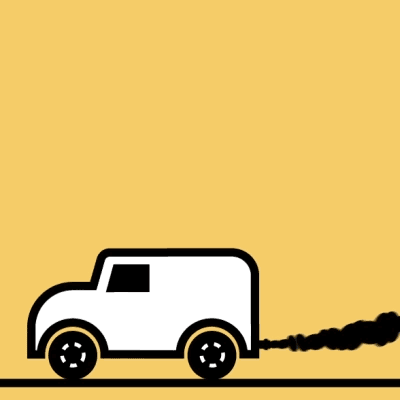

* **Tujuan Utama**: Menurunkan emisi CO2 dan meningkatkan kualitas udara di kota Wiliwilowilev yang terkena krisis lingkungan. Fokus utama adalah pada deteksi merek mobil yang menghasilkan emisi CO2 tinggi.

* **Waktu Terbatas**: Situasi krisis semakin memburuk setiap harinya, sehingga ada tekanan untuk menyelesaikan proyek dengan cepat. Hal ini membutuhkan pengambilan keputusan yang efisien dan cepat berdasarkan analisis data.

* **Akses ke Dataset Emisi CO2**: Tim memiliki akses ke dataset besar mengenai emisi CO2 dari berbagai sumber dan sektor di kota. Dataset ini dikumpulkan oleh freelancer, sehingga memerlukan evaluasi kualitas data sebelum dilakukan analisis lebih lanjut.

* **Deteksi Merek Mobil**: Perlu dilakukan analisis untuk mengidentifikasi merek mobil yang menyumbang pada tingginya emisi CO2. Ini bisa melibatkan pemodelan data untuk mengidentifikasi pola dan korelasi antara merek mobil dengan tingkat emisi CO2.

* **Solusi dan Strategi**: Selain identifikasi merek mobil, tim juga diminta memberikan solusi dan strategi konkret untuk mengurangi emisi CO2. Ini dapat meliputi rekomendasi kebijakan, insentif, atau inisiatif untuk mengurangi emisi secara signifikan.

* **Dampak pada Kesehatan Masyarakat**: Peningkatan emisi CO2 telah berdampak negatif pada kesehatan masyarakat dengan meningkatnya kasus penyakit pernapasan dan kanker. Strategi yang direkomendasikan harus mempertimbangkan dampak langsung pada kesehatan penduduk.

Hasil analisis dan rekomendasi harus disampaikan dengan jelas kepada pemerintah Wiliwilowilev dan masyarakat agar dapat mengambil tindakan yang tepat dan mendukung.

In [1]:
!pip install seaborn
!pip install plotly

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder  
ohe = OneHotEncoder(sparse=False)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
import sys
np.set_printoptions(threshold=sys.maxsize)
# Plotly Libraris
import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
df = pd.read_csv("/kaggle/input/dataslayer/train.csv/train.csv")
df_orig = df.copy()

# Exploratory Data Analysis (EDA)

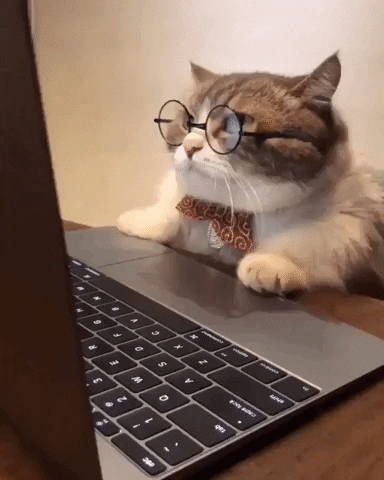

[unlock **insights**, start with **EDA's** delights]

In [3]:
print("data info :")
print(df.info())
print("data shape :")
print(df.shape)

data info :

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 54937 entries, 0 to 54936

Data columns (total 11 columns):

 #   Column                 Non-Null Count  Dtype 

---  ------                 --------------  ----- 

 0   Id                     54937 non-null  int64 

 1   Make                   54937 non-null  object

 2   Vehicle Class          54398 non-null  object

 3   Engine Size(L)         53544 non-null  object

 4   Cylinders              53739 non-null  object

 5   Transmission           54527 non-null  object

 6   Fuel Type              54391 non-null  object

 7   Fuel Consumption City  53369 non-null  object

 8   Fuel Consumption Hwy   53236 non-null  object

 9   Fuel Consumption Comb  53263 non-null  object

 10  CO2 Emissions(g/km)    54937 non-null  int64 

dtypes: int64(2), object(9)

memory usage: 4.6+ MB

None

data shape :

(54937, 11)


**1. Make** 

Nama perusahaan pembuat kendaraan


**2. Vehicle Class**

Kelas kendaraan berdasarkan fungsinya, kapasitas, dan beratnya


**3. Engine Size (L)**

Ukuran mesin yang digunakan dalam liter

**4. Cylinder**

Jumlah silinder

**5. **Transmission****
* A = Otomatis
* AM = Manual otomatis
* AS = Otomatis dengan pilihan shift
* AV = Variabel kontinu
* M = Manual
* 3 - 10 = Jumlah gigi

**6. **Fuel Type (Jenis Bahan Bakar)****
* X = Bensin biasa
* Z = Bensin premium
* D = Diesel
* E = Etanol (E85)
* N = Gas alam

**7. **Fuel Consumption City (Konsumsi Bahan Bakar Kota)****

Kolom ini menampilkan konsumsi bahan bakar kendaraan khususnya saat berkendara di dalam kota.

**8. Fuel Consumption Hwy (Konsumsi Bahan Bakar Jalan Tol)**
Kolom ini menunjukkan konsumsi bahan bakar kendaraan saat berkendara di jalan tol.

**9. Fuel Consumption Comb (Konsumsi Bahan Bakar Gabungan)**
Kolom ini menampilkan rating konsumsi bahan bakar yang dihitung sebagai campuran 55% berkendara di kota dan 45% berkendara di jalan tol.

**10. CO2 Emission (Emisi CO2)**

Emisi karbon dioksida dari knalpot (dalam gram per kilometer) untuk perpaduan berkendara di kota dan di jalan tol.

In [4]:
df = df.rename({
    'Vehicle Class' : 'Vehicle_Class' , 
    'Engine Size(L)': 'Engine_Size' ,
    'Fuel Type' : 'Fuel_Type',
    'Fuel Consumption City' : 'Fuel_Consumption_City_(L/100km)' , 
    'Fuel Consumption Hwy' : 'Fuel_Consumption_Hwy_(L/100km)' ,
    'Fuel Consumption Comb' : 'Fuel_Consumption_Comb' , 
    'CO2 Emissions(g/km)' : 'CO2_Emissions(g/km)'
} , axis = 1)
df.columns

Index(['Id', 'Make', 'Vehicle_Class', 'Engine_Size', 'Cylinders',
       'Transmission', 'Fuel_Type', 'Fuel_Consumption_City_(L/100km)',
       'Fuel_Consumption_Hwy_(L/100km)', 'Fuel_Consumption_Comb',
       'CO2_Emissions(g/km)'],
      dtype='object')

In [5]:
df=df.drop('Id', axis=1)

In [6]:
# Conversion factors
KM_PER_MILE = 1.60934
LITERS_PER_GALLON_IMP = 4.54609
LITERS_PER_GALLON_US = 3.78541

def convert_fuel_consumption(value):
    if pd.isnull(value) or value == '-1' or value == '0':
        return pd.NA  # Handle missing or invalid values
    try:
        # Standardize the string by removing spaces and converting to lowercase
        value = value.lower().replace(' ', '').replace('km/l', 'kmperl')
        
        if 'litersper100km' in value:
            return float(value.split('litersper100km')[0])
        elif 'l/100km' in value:
            return float(value.split('l/100km')[0])
        elif 'l/10km' in value:
            return float(value.split('l/10km')[0]) * 10
        elif 'kmperl' in value:
            return 100 / float(value.split('kmperl')[0])
        elif 'mpgimp.' in value:
            return 100 / (float(value.split('mpgimp.')[0]) * KM_PER_MILE / LITERS_PER_GALLON_IMP)
        elif 'mpg' in value and 'mpgimp.' not in value:
            return 100 / (float(value.split('mpg')[0]) * KM_PER_MILE / LITERS_PER_GALLON_US)
        else:
            return pd.NA  # If the format is not recognized, return missing value indicator
    except (ValueError, IndexError):
        return pd.NA  # In case of any unexpected format errors

In [7]:
# disini kita apply fungsi yang kita buat
df['Fuel_Consumption_City_(L/100km)'] = df['Fuel_Consumption_City_(L/100km)'].apply(convert_fuel_consumption)
df['Fuel_Consumption_Hwy_(L/100km)'] = df['Fuel_Consumption_Hwy_(L/100km)'].apply(convert_fuel_consumption)
df['Fuel_Consumption_Comb'] = df['Fuel_Consumption_Comb'].apply(convert_fuel_consumption)

## Missing Value Overview

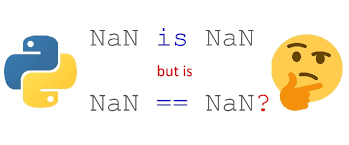

## NaN yang bersembunyi
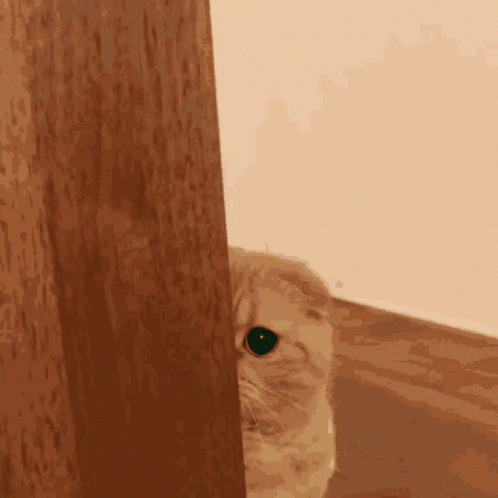

In [8]:
missing_values = ['missing', 'not-recorded', 'na', 'unspecified', 'unknown', 'Unknown',
                  'unestablished', '-1', 'not-available', 'nan', 'unspecifie', 'not-recorde', 'unknow',
                  'missin', 'not-availabl', 'n', '-','unestablishe']

Ada yang unik disini data yang hilang tidak hanya berupa NaN, akan tetapi ada jenis NaN lain yang "bersembunyi".

Di sini, kita melakukan penggantian nilai-nilai tertentu dalam beberapa nilai di DataFrame dengan nilai yang sesuai untuk merepresentasikan missing value, yaitu NaN (Not a Number). Terdapat berbagai macam istilah yang sebenarnya mengindikasikan bahwa data hilang atau tidak tersedia. Misalnya, istilah 'missing', 'not-recorded', 'unknown', dan sejenisnya sebenarnya ingin kita samakan dengan NaN agar lebih mudah dikelola.

Proses ini dilakukan agar kita dapat mengidentifikasi dengan lebih mudah di mana nilai-nilai yang seharusnya ada dalam data sebenarnya tidak tersedia atau hilang. Dengan mengganti beragam istilah tersebut menjadi NaN, kita membuat representasi tunggal untuk missing value, sehingga mempermudah analisis dan pengelolaan data secara keseluruhan.

In [9]:
df['Engine_Size'].replace(missing_values, np.nan, inplace=True)
df['Cylinders'].replace(missing_values, np.nan, inplace=True)
df['Vehicle_Class'].replace(missing_values, np.nan, inplace=True)
df['Transmission'].replace(missing_values, np.nan, inplace=True)
df['Fuel_Type'].replace(missing_values, np.nan, inplace=True)

In [10]:
df.isnull().sum()

Make                                  0
Vehicle_Class                      2051
Engine_Size                        5264
Cylinders                          4523
Transmission                       1483
Fuel_Type                          1942
Fuel_Consumption_City_(L/100km)    2325
Fuel_Consumption_Hwy_(L/100km)     2563
Fuel_Consumption_Comb              2552
CO2_Emissions(g/km)                   0
dtype: int64

In [11]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(df)

,Total,Percent
Engine_Size,5264,9.581885
Cylinders,4523,8.233067
Fuel_Consumption_Hwy_(L/100km),2563,4.665344
Fuel_Consumption_Comb,2552,4.645321
Fuel_Consumption_City_(L/100km),2325,4.232120
Vehicle_Class,2051,3.733367
Fuel_Type,1942,3.534958
Transmission,1483,2.699456
Make,0,0.000000
CO2_Emissions(g/km),0,0.000000


Disini dapat terlihat bahwa masing-masing fitur, nilai NaN nya hanya dibawah 10% dan berdasarkan sumber-sumber kredibel:  https://datascience.stackexchange.com/questions/116217/variable-selection-and-na

kita tidak perlu menseleksi fiturnya apabila NaN dibawah 80%, sehingga kami memutuskan untuk membiarkan setiap kolomnya karena kami percaya setiap kolom memberikan nilai yang unik.

## Check Redundansi Data

In [14]:
# Duplicated data
df_duplicated=df[df.duplicated() == True]
df_duplicated

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km)


Semua data disini **unik** dan **tidak ada redundansi data**, oleh karena itu kita tetap mempertahankan bentuk formasi data karena dalam machine learning, setiap baris data memberikan petunjuk yang unik kepada model tentang bagaimana membuat prediksi yang tepat. Ini seperti memastikan bahwa setiap kisah dalam buku memiliki cerita yang berbeda dan penting. Jika kita memiliki data yang terulang, seperti membaca cerita yang sama berulang kali, model mungkin kebingungan dan tidak bisa belajar dengan baik. Data yang unik membantu model untuk belajar dari banyak hal yang berbeda, memastikan bahwa model dapat membuat prediksi yang lebih baik saat dihadapkan pada situasi yang belum pernah dilihat sebelumnya. Jadi, dalam hal machine learning, menjaga keunikan data mirip dengan memberikan setiap cerita yang berbeda dalam buku, memungkinkan model untuk belajar dan membuat prediksi yang lebih akurat.

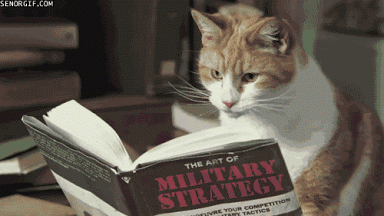

In [18]:
# Kolom yang akan diubah menjadi float
columns_to_float = [
    'Engine_Size',
    'Cylinders',
    'Fuel_Consumption_City_(L/100km)',
    'Fuel_Consumption_Hwy_(L/100km)',
    'Fuel_Consumption_Comb'
]

# Mengubah kolom-kolom tertentu menjadi float
df[columns_to_float] = df[columns_to_float].astype(float)

In [19]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engine_Size,35898.0,2.980183,1.305359,1.000000,2.000000,2.500000,3.600000,8.400000
Cylinders,35898.0,5.297482,1.607226,3.000000,4.000000,4.000000,6.000000,12.000000
Fuel_Consumption_City_(L/100km),35898.0,12.548201,3.862061,4.199846,9.900000,11.701808,15.105740,30.500000
Fuel_Consumption_Hwy_(L/100km),35898.0,9.153392,2.356289,4.500000,7.500000,8.599137,10.398544,20.500000
Fuel_Consumption_Comb,35898.0,11.020586,2.981988,4.470070,8.865248,10.320000,13.000000,25.316456
CO2_Emissions(g/km),35898.0,246.692351,67.616360,96.000000,197.000000,233.000000,290.000000,522.000000


Dari data describe yang didapatkan hal yang akan dilakukan adalah menganalisis lebih lanjut persebaran data. Hal ini dikarenakan nilai-nilai pada data describe tidak menunjukkan adanya pencilan (outlier) yang signifikan.

## Check nilai unik yang ada di masing-masing kolom

In [31]:
def get_unique_values(df):
    
    output_data = []

    for col in df.columns:

        # If the number of unique values in the column is less than or equal to 5
        if df.loc[:, col].nunique() <= 10:
            # Get the unique values in the column
            unique_values = df.loc[:, col].unique()
            # Append the column name, number of unique values, unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

In [32]:
get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,Make,21,-,object
1,Vehicle_Class,16,-,object
2,Engine_Size,42,-,float64
3,Cylinders,7,"[4.0, 6.0, 3.0, 8.0, 10.0, 12.0, 5.0]",float64
4,Transmission,25,-,object
5,Fuel_Type,5,"[X, Z, E, D, N]",object
6,Fuel_Consumption_City_(L/100km),950,-,float64
7,Fuel_Consumption_Hwy_(L/100km),650,-,float64
8,Fuel_Consumption_Comb,6065,-,float64
9,CO2_Emissions(g/km),406,-,int64


## Pemusatan Data

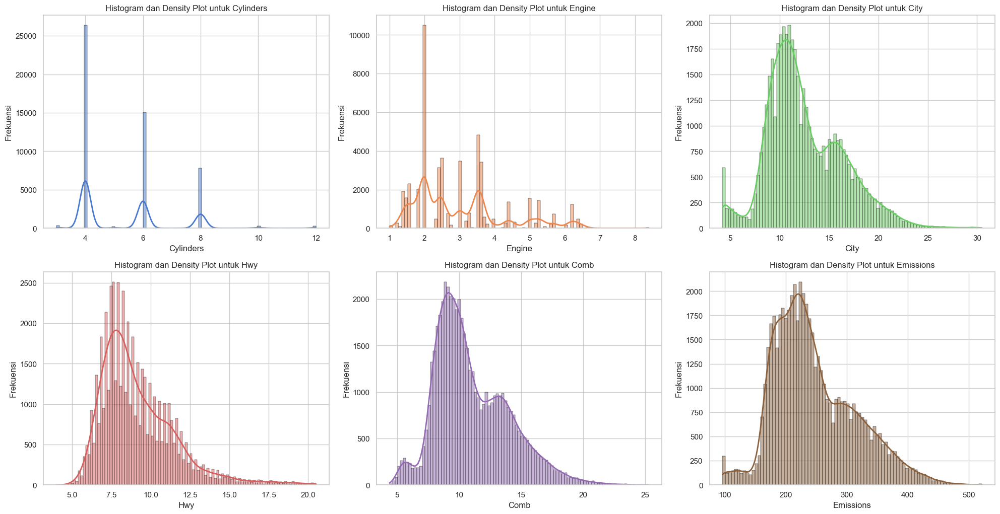

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Mengatur gaya plot
sns.set(style="whitegrid")

# Mendapatkan kolom-kolom numerik
numeric_columns = df.select_dtypes(include=['number']).columns

# Mengatur layout plot
n_rows = 3
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))  # Mengatur ukuran keseluruhan figure

# Mendefinisikan palet warna
palette = sns.color_palette("muted", len(numeric_columns))

# Mengisi setiap subplot
for i, column in enumerate(numeric_columns):
    row = i // n_cols
    col = i % n_cols
    # Menggambar histogram dengan KDE, dan menetapkan warna garis KDE menjadi hitam
    sns.histplot(df[column], kde=True, color=palette[i], edgecolor='black', 
                 line_kws={'color':'black', 'lw':2}, ax=axes[row, col])
    axes[row, col].set_title(f'Histogram dan Density Plot untuk {column}')
    axes[row, col].set_xlabel(column)
    axes[row, col].set_ylabel('Frekuensi')

# Menyembunyikan subplot kosong jika ada
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j // n_cols, j % n_cols])

plt.tight_layout()
plt.show()


**1. Cylinders (Silinder)**: Histogram ini menunjukkan distribusi multimodal, artinya ada beberapa puncak yang terlihat. Kebanyakan mobil tampaknya memiliki 4, 6, atau 8 silinder. Distribusi 4 silinder sangat dominan dibandingkan yang lain, menunjukkan bahwa sebagian besar kendaraan dalam dataset ini menggunakan mesin 4 silinder.

**2. Engine (Mesin)**: Plot ini juga menunjukkan distribusi multimodal dan sepertinya variabel 'Engine' ini berkisar antara 1 hingga 8 dengan puncak yang terlihat jelas pada mesin dengan ukuran sekitar 2, 3.5, dan lebih tinggi sedikit pada 4.5. Ini bisa menunjukkan ukuran mesin dalam liter dan variasi yang umum ada pada kendaraan yang diukur.

**3. Fuel Consumption City (Kota)**: Ini adalah distribusi dengan satu puncak yang cukup lebar, menunjukkan bahwa konsumsi bahan bakar di kota cenderung berkonsentrasi di sekitar nilai tertentu dengan beberapa mobil yang jauh lebih efisien atau boros.

**4. Fuel Consumption Hwy (Jalan Raya)**: Mirip dengan 'City', distribusi untuk penggunaan bahan bakar di jalan raya juga unimodal tetapi lebih sempit, menunjukkan bahwa kendaraan cenderung lebih konsisten dalam efisiensi bahan bakar di jalan raya dibandingkan di kota.

**5. Fuel Consumption Comb (Gabungan)**: Plot ini menggabungkan penggunaan bahan bakar di kota dan jalan raya, menghasilkan satu puncak yang mencerminkan distribusi normal atau Gauss, dengan mayoritas kendaraan memiliki konsumsi bahan bakar gabungan yang terkonsentrasi di sekitar nilai tengah.

**6. Emissions (Emisi)**: Histogram ini menunjukkan distribusi emisi yang lebar dengan puncak di sekitar nilai yang lebih rendah. Ini menunjukkan bahwa sebagian besar kendaraan memiliki emisi yang lebih rendah, tetapi masih ada jumlah yang signifikan dengan emisi yang sangat tinggi.

Dari analisis ini, kita bisa mengambil beberapa insight:

> Preferensi Mesin: Terdapat preferensi yang jelas terhadap mesin dengan jumlah silinder tertentu, khususnya mesin 4 silinder.

> Efisiensi Bahan Bakar: Ada variasi yang cukup besar dalam konsumsi bahan bakar, baik di kota maupun di jalan raya, namun kendaraan cenderung lebih efisien di jalan raya.


## Persebaran Data

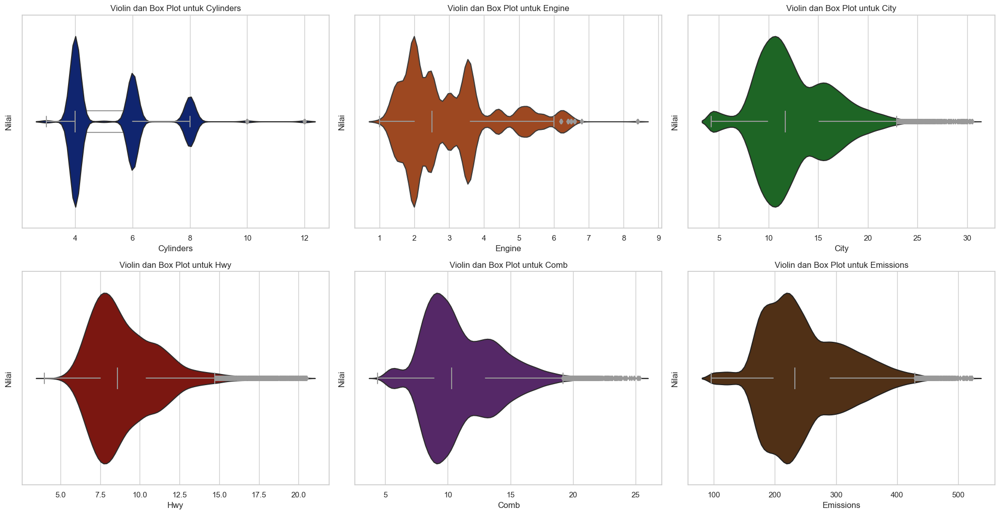

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Membaca file
# df = pd.read_csv('your_file.csv')  # Ganti dengan path file Anda

# Mengatur gaya plot
sns.set(style="whitegrid")

# Mendapatkan kolom-kolom numerik
numeric_columns = df.select_dtypes(include=['number']).columns

# Mengatur layout plot
n_rows = 3
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))  # Mengatur ukuran keseluruhan figure

# Mendefinisikan palet warna
palette = sns.color_palette("dark", len(numeric_columns))

# Mengisi setiap subplot
for i, column in enumerate(numeric_columns):
    row = i // n_cols
    col = i % n_cols
    # Menggabungkan violin plot dengan box plot
    sns.violinplot(x=df[column], color=palette[i], ax=axes[row, col], inner=None)
    sns.boxplot(x=df[column], color='white', ax=axes[row, col], width=0.1)
    
    axes[row, col].set_title(f'Violin dan Box Plot untuk {column}')
    axes[row, col].set_xlabel(column)
    axes[row, col].set_ylabel('Nilai')

# Menyembunyikan subplot kosong jika ada
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j // n_cols, j % n_cols])

plt.tight_layout()
plt.show()


**1. Cylinders (Silinder):** Violin plot untuk silinder menunjukkan distribusi data yang sangat tertentu untuk 4, 6, dan 8 silinder dengan sedikit data pada 5 dan 12 silinder. Kepadatan data terbesar adalah pada 4 silinder, menunjukkan sebagian besar kendaraan dalam sampel memiliki 4 silinder. Box plot menunjukkan bahwa nilai median terletak di sekitar 6 silinder, dan tidak banyak outlier atau data ekstrem yang terlihat.

**2. Engine (Mesin):** Plot untuk ukuran mesin menunjukkan variasi yang lebih luas dengan beberapa puncak dan lekukan yang menandakan distribusi yang lebih kompleks. Terdapat kepadatan yang lebih tinggi pada nilai yang lebih rendah, yang bisa mengindikasikan bahwa mesin dengan ukuran lebih kecil lebih umum. Box plot terintegrasi menunjukkan median yang hampir sejajar dengan salah satu puncak dari violin plot, dan terdapat beberapa outlier yang terlihat jelas.

**3. City (Kota):** Violin plot untuk konsumsi bahan bakar di kota memiliki bentuk yang lebar dan datar, menandakan variasi yang tinggi dalam konsumsi bahan bakar di kota. Meskipun begitu, terdapat puncak di bagian tengah yang menunjukkan nilai yang paling sering muncul. Box plot menunjukkan bahwa nilai tengah terletak di sekitar puncak tersebut, dengan beberapa outlier yang memperpanjang ekor plot.

**4. Hwy (Jalan Raya):** Plot ini menunjukkan distribusi yang cukup simetris dengan puncak yang tajam di tengah, menandakan bahwa konsumsi bahan bakar di jalan raya cenderung konsisten dan terpusat pada nilai tertentu. Box plot menunjukkan median yang tepat di tengah puncak tersebut, dengan sedikit outlier.

**5. Comb (Gabungan):** Violin plot untuk konsumsi bahan bakar gabungan menunjukkan dua puncak yang menandakan dua kelompok utama dalam data: satu dengan konsumsi bahan bakar rendah dan satu lagi dengan konsumsi yang sedikit lebih tinggi. Ini bisa mengindikasikan adanya jenis kendaraan yang berbeda dalam sampel.

**6. Emissions (Emisi):** Plot untuk emisi menunjukkan bentuk yang sangat lebar dan datar, yang menunjukkan bahwa ada variasi yang sangat tinggi dalam emisi yang dihasilkan oleh kendaraan. Terdapat ekor yang panjang menuju nilai emisi yang lebih tinggi, menandakan bahwa sementara sebagian besar kendaraan memiliki emisi yang rendah, ada sejumlah kendaraan yang menghasilkan emisi yang sangat tinggi.



> Variabilitas Mesin dan Silinder: Terdapat variasi yang signifikan dalam ukuran mesin dan jumlah silinder yang digunakan oleh kendaraan, dengan preferensi yang kuat terhadap mesin yang lebih kecil dan jumlah silinder yang lebih rendah.

> Efisiensi Bahan Bakar: Data menunjukkan bahwa ada konsistensi dalam efisiensi bahan bakar di jalan raya dibandingkan di kota, dengan variasi yang lebih rendah.

## Make

In [24]:
df["Make"].unique()

array(['MITSU', 'MATSUDA', 'TOYOTI', 'DOGE', 'LECUS', 'FOLD', 'KIO',
       'JIPU', 'NIRRAN', 'CADILUXE', 'BARUSU', 'GONDA', 'LAND CRAWLER',
       'CHEVO', 'RYUNDAI', 'FOLKSWA', 'BMV', 'TOLVO', 'FIAR', 'LAMBOGI',
       'ASURA'], dtype=object)

In [25]:
df_Make=df['Make'].value_counts().reset_index().rename(columns={'index':'Make','Make':'Count'})[0:25]

In [26]:
df_Make.rename(columns={'Count': 'Make'}, inplace=True)

In [27]:
df_Make

,Make,count
0,FOLD,4693
1,CHEVO,4280
2,BMV,3907
3,TOYOTI,2447
4,NIRRAN,1979
5,DOGE,1856
6,JIPU,1833
7,KIO,1673
8,GONDA,1670
9,RYUNDAI,1577


In [29]:
fig = go.Figure(go.Bar(
    x=df_Make['Make'],y=df_Make['count'],
    marker={'color': df_Make['count'], 
    'colorscale': 'Viridis'},  
    text=df_Make['count'],
    textposition = "outside",
))
fig.update_layout(title_text='Top 20 Company',xaxis_title="Company ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

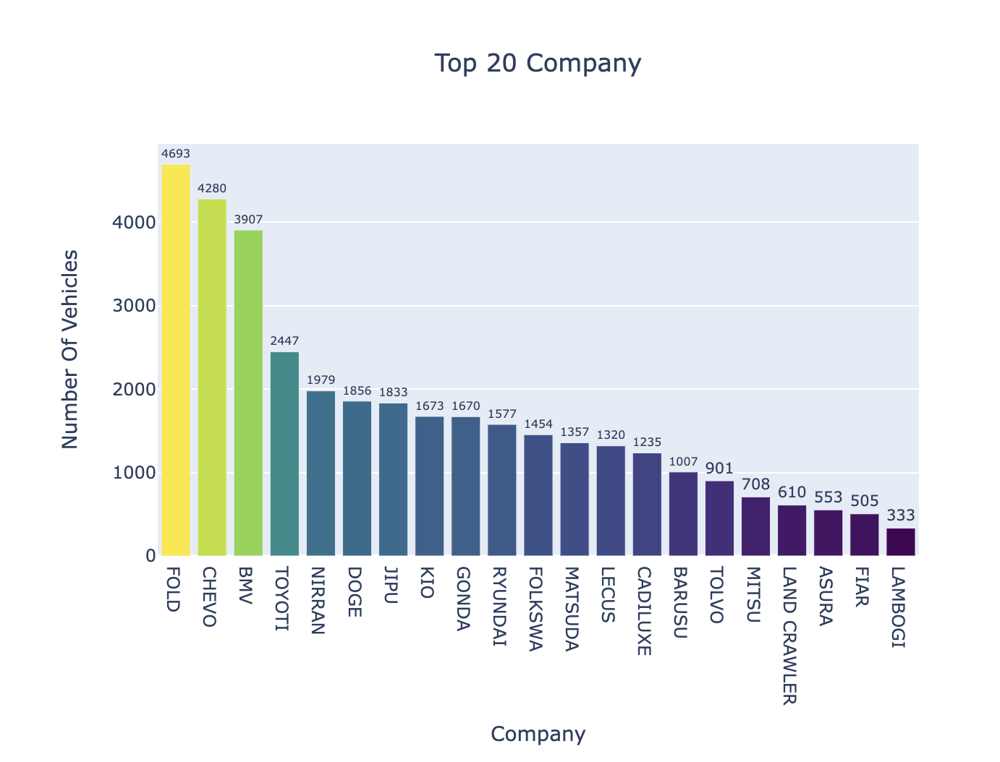

Disini dapat terlihat bahwa:

**1. Dominasi Produksi:**

Merek FOLD, CHEVO, dan BMV merupakan produsen kendaraan dengan produksi terbanyak, masing-masing dengan 4693, 4280, dan 3907 unit.
Sejumlah merek lainnya, seperti TOYOTI dan NIRRAN, juga memiliki produksi yang signifikan, dengan masing-masing 2447 dan 1979 unit.

**2. Distribusi Produksi yang Bervariasi:**

Distribusi produksi kendaraan cukup bervariasi di antara merek-merek tersebut. Ada perusahaan dengan produksi tinggi seperti FOLD, CHEVO, dan BMV, sementara yang lain memiliki kontribusi yang lebih rendah.
Perusahaan dengan Produksi Rendah:

Sejumlah merek, seperti LAMBOGI, FIAR, ASURA, dan LAND CRAWLER, MITSU, TOLVO memiliki produksi yang relatif lebih rendah, masing-masing di bawah 1000 unit.

**3.Pentingnya Analisis CO2 Emission:**

Perusahaan dengan produksi tinggi mungkin perlu mendapatkan perhatian lebih terkait dampak lingkungan yang dihasilkan oleh kendaraan mereka.


LAND CRAWLER menjadi outlier dengan produksi yang lebih rendah. Penting untuk mengeksplorasi apakah karakteristik khusus merek ini atau faktor lain yang mempengaruhi.

In [75]:
import pandas as pd
from scipy.stats import f_oneway

# Melakukan uji ANOVA
anova = f_oneway(df['CO2_Emissions(g/km)'][df['Make'] == 'FOLD'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'CHEVO'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'BMV'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'TOYOTI'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'NIRRAN'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'DOGE'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'JIPU'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'KIO'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'GONDA'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'RYUNDAI'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'FOLKSWA'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'MATSUDA'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'LECUS'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'CADILUXE'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'BARUSU'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'TOLVO'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'MITSU'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'LAND CRAWLER'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'ASURA'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'FIAR'],
                 df['CO2_Emissions(g/km)'][df['Make'] == 'LAMBOGI'])

# Tampilkan hasil uji ANOVA
print("== Hasil uji ANOVA: ==")
print(anova)
# Kesimpulan berdasarkan p-value
print ("   ")
print("=== Kesimpulan ===")
if anova.pvalue < 0.05:
    print("Terdapat perbedaan yang signifikan antara setidaknya satu pasang kelompok rata-rata.")
else:
    print("Tidak terdapat perbedaan yang signifikan antara kelompok rata-rata yang diuji.")

== Hasil uji ANOVA: ==

F_onewayResult(statistic=732.0673057814303, pvalue=0.0)

   

=== Kesimpulan ===

Terdapat perbedaan yang signifikan antara setidaknya satu pasang kelompok rata-rata.


Dapat terlihat disini dari uji Anova, ada bukti yang cukup untuk mengatakan bahwa merk kendaraan mempengaruhi emisi CO2

<Figure size 10000x2000 with 0 Axes>

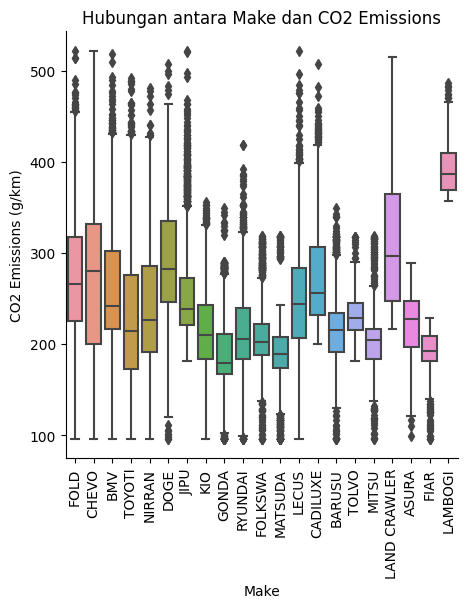

In [79]:
plt.figure(figsize=(100, 20))
sns.catplot(x='Make', y='CO2_Emissions(g/km)', kind='box', data=df, order=df_Make['Make'])
plt.title('Hubungan antara Make dan CO2 Emissions')
plt.xlabel('Make')
plt.ylabel('CO2 Emissions (g/km)')
plt.xticks(rotation=90)  # Rotasi label sumbu x agar mudah dibaca
plt.show()

Dapat terlihat disini bahwa masing-masing merk rata-rata memiliki rentang yang sama CO2 Emissionnya yaitu antara 100-500, tidak peduli apakah dia memiliki banyak produksi mobil atau tidak sehingga emisi karbonnya cukup variatif tiap merknya.

Namun yang menarik disini adalah Lambogi yang memproduksi paling sedikit, konsisten menyumbang emisi karbondioksida yang tinggi namun tidak terlalu bervariasi yaitu di rentang 350-500. Disusul oleh Land Crawler yang produksinya menyumbang emisi karbon dari 200-500, namun masing-masing model cenderung lebih bervariasi dalam menyumbang karbon.

## Vehicle Class

In [31]:
df['Vehicle_Class'].unique()

array(['SUV - SMALL', 'COMPACT', 'MID-SIZE', 'SUV - STANDARD',
       'STATION WAGON - SMALL', 'FULL-SIZE', 'TWO-SEATER',
       'PICKUP TRUCK - STANDARD', 'SUBCOMPACT',
       'STATION WAGON - MID-SIZE', 'MINICOMPACT', 'PICKUP TRUCK - SMALL',
       'SPECIAL PURPOSE VEHICLE', 'MINIVAN', 'VAN - PASSENGER',
       'VAN - CARGO'], dtype=object)

In [33]:
df_Vehicle_Class=df['Vehicle_Class'].value_counts().reset_index().rename(columns={'index':'Vehicle_Class','Vehicle Class':'Count'})

In [34]:
df_Vehicle_Class

,Vehicle_Class,count
0,SUV - SMALL,7451
1,COMPACT,6199
2,MID-SIZE,5711
3,SUV - STANDARD,3235
4,FULL-SIZE,2717
5,PICKUP TRUCK - STANDARD,2609
6,SUBCOMPACT,2437
7,STATION WAGON - SMALL,1575
8,TWO-SEATER,1134
9,PICKUP TRUCK - SMALL,894


In [36]:
df_Vehicle_Class.rename(columns={'count': 'Count'}, inplace=True)

In [42]:
fig = go.Figure(go.Bar(
    x=df_Vehicle_Class['Vehicle_Class'],y=df_Vehicle_Class['Count'],
    marker={'color': df_Vehicle_Class['Count'], 
    'colorscale': 'Viridis'},  
    text=df_Vehicle_Class['Count'],
    textposition = "outside",
))
fig.update_layout(title_text=' Vehicle Class',xaxis_title="Vehicle Class",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

## Engine Size

In [39]:
fig = px.histogram(df, x="Engine_Size", marginal="rug", # can be `box`, `violin`
                         hover_data=df.columns)
fig.show(renderer="iframe")

In [40]:
fig = go.Figure(data=[go.Histogram(x=df["Engine_Size"], histnorm='probability')])
fig.update_layout(title_text='Normalized Distribution Of Engine Size ',xaxis_title=" Engine Size (L)",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

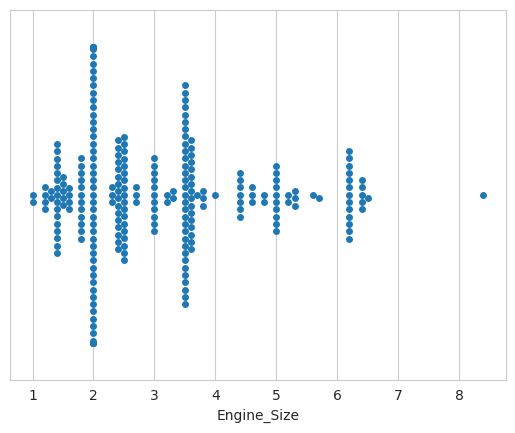

In [43]:
sns.set_style(style="whitegrid")
ax = sns.swarmplot(x=df["Engine_Size"][0:250])

In [44]:
fig = px.scatter(df, x="Engine_Size", y="Cylinders")
fig.update_layout(title_text='Cylinders vs Engine Size ',xaxis_title=" Engine Size (L)",yaxis_title="Cylinders",title_x=0.5)
fig.show(renderer="iframe")

## Cylinders

In [45]:
fig = px.histogram(df, x="Cylinders")
fig.update_layout(title_text='Distribution Of Cylinders  ',xaxis_title=" Cylinders ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

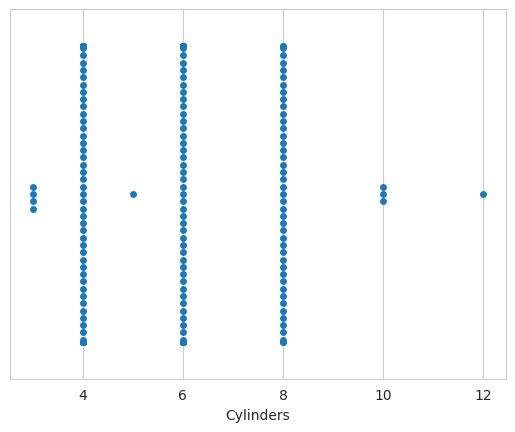

In [46]:
sns.set_style(style="whitegrid")
ax = sns.swarmplot(x=df["Cylinders"][0:250])

In [48]:
fig = go.Figure(data=[go.Histogram(x=df["Cylinders"], histnorm='probability')])
fig.update_layout(title_text='Normalized Distribution Of Cylinders  ',xaxis_title=" Cylinders ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

In [49]:
df["Gears"]= df['Transmission'].str[-1]

df['Transmission']=df['Transmission'].str[0:-1]
df.head()

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km),Gears
0,MITSU,SUV - SMALL,1.5,4.0,AV,X,11.904762,7.200000,9.800000,208,8
2,MATSUDA,COMPACT,2.0,4.0,AS,X,10.204082,7.299267,8.894258,170,6
4,TOYOTI,COMPACT,1.8,4.0,M,X,8.100000,7.899375,8.010000,180,6
5,DOGE,MID-SIZE,2.4,4.0,A,X,11.299435,8.000512,9.810000,216,6
7,LECUS,MID-SIZE,3.5,6.0,AS,X,12.000768,9.900990,11.053339,221,6


In [50]:
df_Transmission=df['Transmission'].value_counts().reset_index().rename(columns={'index':'Transmission','Transmission':'Count'})

In [53]:
df_Transmission

,Transmission,Count
0,AS,14634
1,A,9475
2,M,6681
3,AV,1844
4,AM,1821
5,AS1,1250
6,A1,105
7,AV1,88


In [52]:
df_Transmission.rename(columns={'count': 'Count', 'Count': 'Transmission'}, inplace=True)

In [55]:
fig = px.pie(df_Transmission, values='Count', names='Transmission')

fig.update_traces(hoverinfo='label+percent', textinfo='value+percent', textfont_size=12,insidetextorientation='radial')
fig.update_layout(title="Transmission Distribution",title_x=0.5)
fig.show(renderer="iframe")

## Fuel Consumption

In [57]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_City_(L/100km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption City  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

In [59]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_City_(L/100km)"],
    name='Fuel Consumption City',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='Fuel Consumption City',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show(renderer="iframe")

In [61]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_City_(L/100km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Consumption City'))

fig.update_layout(yaxis_zeroline=False)
fig.show(renderer="iframe")

In [63]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_Hwy_(L/100km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Highways  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

In [65]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_Hwy_(L/100km)"],
    name='Fuel Consumption Hwy',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='Fuel Consumption Highways ',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show(renderer="iframe")

In [67]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_Hwy_(L/100km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Consumption City'))

fig.update_layout(yaxis_zeroline=False)
fig.show(renderer="iframe")

In [69]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_Comb"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Combined  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

In [70]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_Comb"],
    name='Fuel Consumption Comb ',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='The Combined Fuel Consumption',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show(renderer="iframe")

In [72]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_Comb"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Combined Fuel Consumption'))

fig.update_layout(yaxis_zeroline=False)
fig.show(renderer="iframe")

## Co2 Emission

In [73]:
fig = go.Figure(data=[go.Histogram(x=df["CO2_Emissions(g/km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Combined  Mile Per Gallon ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

In [75]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["CO2_Emissions(g/km)"],
    name='CO2 Emissions ',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='CO2 Emissions',yaxis_title="Quantity",title_x=0.5)
fig.show(renderer="iframe")

In [77]:
fig = go.Figure(data=go.Violin(y=df["CO2_Emissions(g/km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='CO2 Emissions'))

fig.update_layout(yaxis_zeroline=False,yaxis_title="Quantity",title_x=0.5)
fig.show(renderer="iframe")

Correlation Matrix


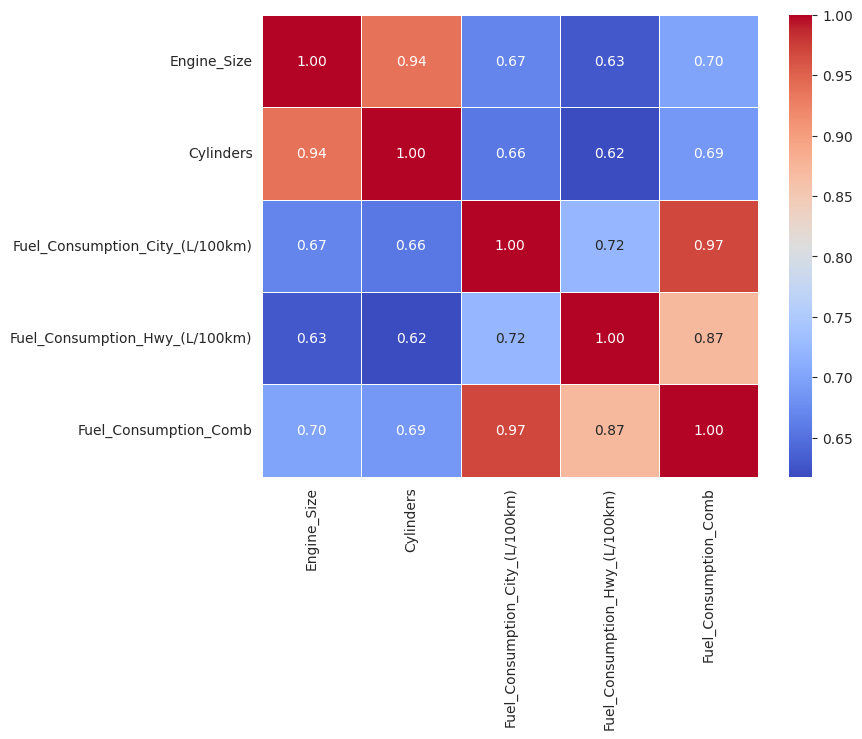

In [78]:
df_numeric=df[['Engine_Size', 'Cylinders', 'Fuel_Consumption_City_(L/100km)', 'Fuel_Consumption_Hwy_(L/100km)', 'Fuel_Consumption_Comb']]
print("Correlation Matrix")
plt.rcParams['figure.figsize']=(8,6)
sns.heatmap(df_numeric.corr(),cmap='coolwarm',linewidths=.5,fmt=".2f",annot = True);

# Pre-Processing

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# Penggantian nama variabel untuk memudahkan preprocessing
df = pd.read_csv("C:/Python/00 - Template/Data Science/Slayer/train_new.csv")
df["Vehicle"] = df["Vehicle Class"]
df["Engine"] = df["Engine Size(L)"]
df["Fuel"] = df["Fuel Type"] 
df["City"] = df["Fuel Consumption City"]
df["Hwy"] = df["Fuel Consumption Hwy"]
df["Comb"] = df["Fuel Consumption Comb"]
df["Emissions"] = df["CO2 Emissions(g/km)"]


In [ ]:
# Membuang variabel dengan nama yang lama
drop = ["Id", "Vehicle Class", "Engine Size(L)", "Fuel Type", "Fuel Consumption City", "Fuel Consumption Hwy", "Fuel Consumption Comb", "CO2 Emissions(g/km)"]
df = df.drop(drop, axis=1)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 54937 entries, 0 to 54936

Data columns (total 10 columns):

 #   Column        Non-Null Count  Dtype 

---  ------        --------------  ----- 

 0   Make          54937 non-null  object

 1   Cylinders     53739 non-null  object

 2   Transmission  54527 non-null  object

 3   Vehicle       54398 non-null  object

 4   Engine        53544 non-null  object

 5   Fuel          54391 non-null  object

 6   City          53369 non-null  object

 7   Hwy           53236 non-null  object

 8   Comb          53263 non-null  object

 9   Emissions     54937 non-null  int64 

dtypes: int64(1), object(9)

memory usage: 4.2+ MB


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 54937 entries, 0 to 54936

Data columns (total 10 columns):

 #   Column        Non-Null Count  Dtype 

---  ------        --------------  ----- 

 0   Make          54937 non-null  object

 1   Cylinders     53739 non-null  object

 2   Transmission  54527 non-null  object

 3   Vehicle       54398 non-null  object

 4   Engine        53544 non-null  object

 5   Fuel          54391 non-null  object

 6   City          53369 non-null  object

 7   Hwy           53236 non-null  object

 8   Comb          53263 non-null  object

 9   Emissions     54937 non-null  int64 

dtypes: int64(1), object(9)

memory usage: 4.2+ MB


In [ ]:
print(df.isna().sum())

Make               0

Cylinders       1198

Transmission     410

Vehicle          539

Engine          1393

Fuel             546

City            1568

Hwy             1701

Comb            1674

Emissions          0

dtype: int64


## Pre Processing Konsistensi Data

### Variabel "Make"

In [ ]:
print(df["Make"].unique())

['MITSU' 'TOYOTI' 'MATSUDA' 'CHEVO' 'DOGE' 'BMV' 'LECUS' 'KIO' 'FOLD'

 'JIPU' 'NIRRAN' 'CADILUXE' 'FOLKSWA' 'BARUSU' 'GONDA' 'LAND CRAWLER'

 'RYUNDAI' 'TOLVO' 'FIAR' 'ASURA' 'LAMBOGI']


In [ ]:
# Memastikan seluruh data tertulis dalam kapital
df['Make'] = df['Make'].str.upper()
df["Make"].head()

0      MITSU
1     TOYOTI
2    MATSUDA
3      CHEVO
4     TOYOTI
Name: Make, dtype: object

### Cylinders

In [ ]:
print(df["Cylinders"].unique())

['4.0' '6.0' '8.0' 'unknown' 'na' '3.0' '10.0' 'not-recorded'

 'unspecified' '12.0' nan '5.0' 'missing' 'not-available' 'unestablished']


In [ ]:
# Identifikasi data Irregular
irregular_values = ['not-available', 'unestablished', 'unspecified', 'not-recorded', '-1', 'missing', 'unknown', 'na']

# Mengganti nilai Irregular dengan Nan
df['Cylinders'] = df['Cylinders'].replace(irregular_values, np.nan)

# Memastikan Cylinders diubah menjadi variabel numerik
df['Cylinders'] = pd.to_numeric(df['Cylinders'], errors='coerce')

### Transmission

In [ ]:
import pandas as pd
import numpy as np

# Daftar nilai yang dianggap hilang
missing_values = ['unspecified', 'not-recorded', 'unknown', 'missing', "Unknown", 
                  'not-available', 'na', 'unestablished', '-1']

# Mengganti nilai-nilai ini dengan NaN dari NumPy
df['Transmission'].replace(missing_values, np.nan, inplace=True)

# Mengganti nilai-nilai ini dengan NaN dari NumPy
df['Transmission'] = df['Transmission'].astype('category')

### Vehicle Class

In [ ]:
import pandas as pd

# Data Irregular
missing_values = ['missing', 'not-recorded', 'na', 'unspecified', 'unknown', 
                  'unestablished', '-1', 'not-available']

# Mengganti nilai-nilai ini dengan NaN (Menggunakan pd.NA untuk representasi yang lebih konsisten)
df['Vehicle'].replace(missing_values, np.nan, inplace=True)


# Mengganti nilai-nilai ini dengan NaN dari NumPy
df['Vehicle'] = df['Vehicle'].astype('category')

### Engine Size

In [ ]:
import numpy as np

# Mengganti Irregular data dengan Nan
non_numeric_placeholders = ['unspecified', 'missing', 'na', 'not-available', 'not-recorded', 'unknown', 'unestablished', '-1']
df['Engine'] = df['Engine'].replace(non_numeric_placeholders, np.nan)

# Convert the 'Engine Size(L)' column to float
df['Engine'] = pd.to_numeric(df['Engine'], errors='coerce')

### Fuel

In [ ]:
import pandas as pd

# Irregular Data
missing_values = ['-1', 'missing', 'unspecified', 'not-recorded', 'unknown', 
                  'unestablished', 'na', 'not-available']

# Mengganti nilai-nilai ini dengan NaN (Menggunakan pd.NA untuk representasi yang lebih konsisten)
df['Fuel'].replace(missing_values, np.nan, inplace=True)
df['Fuel'] = df['Fuel'].astype('category')


### City

In [ ]:
print(df["City"].unique())

['8.40 km/L' '7.25 km per L' '9.80 km/L' ... '25.40 liters per 100 km'

 '24.60 L/100 km' '28.80 liters per 100 km']


In [ ]:
import pandas as pd

# Faktor Konversi
KM_PER_MILE = 1.60934
LITERS_PER_GALLON_IMP = 4.54609
LITERS_PER_GALLON_US = 3.78541

def convert_fuel_consumption(value):
    if pd.isnull(value) or value == '-1' or value == '0':
        return np.nan  # Memastikan tidak terjadi error
    try:
        value = value.lower().replace(' ', '')  # Merubah data menjadi tulisan nonkapital dan menghapu spasi
        if 'litersper100km' in value:
            return float(value.split('litersper100km')[0])
        elif 'l/100km' in value:
            return float(value.split('l/100km')[0])
        elif 'l/10km' in value:
            return float(value.split('l/10km')[0]) * 10
        elif 'kmperl' in value:
            return 100 / float(value.split('kmperl')[0])
        elif 'mpgimp.' in value:
            return 100 / (float(value.split('mpgimp.')[0]) * KM_PER_MILE / LITERS_PER_GALLON_IMP)
        elif 'mpg' in value and 'mpgimp.' not in value:
            return 100 / (float(value.split('mpg')[0]) * KM_PER_MILE / LITERS_PER_GALLON_US)
        else:
            return np.nan  # If the format is not recognized, return missing value indicator
    except (ValueError, IndexError):
        return np.nan  # In case of any unexpected format errors

# Menjalankan fungsi kedalam variabel City
df['City'] = df['City'].apply(convert_fuel_consumption)


### Hwy

In [ ]:
import pandas as pd

# Faktor Konversi
KM_PER_MILE = 1.60934
LITERS_PER_GALLON_IMP = 4.54609
LITERS_PER_GALLON_US = 3.78541

def convert_fuel_consumption(value):
    if pd.isnull(value) or value == '-1' or value == '0':
        return np.nan  # Memastikan tidak terjadi error
    try:
        # Merubah data menjadi tulisan nonkapital dan menghapus spasi
        value = value.lower().replace(' ', '').replace('km/l', 'kmperl')
        
        if 'litersper100km' in value:
            return float(value.split('litersper100km')[0])
        elif 'l/100km' in value:
            return float(value.split('l/100km')[0])
        elif 'l/10km' in value:
            return float(value.split('l/10km')[0]) * 10
        elif 'kmperl' in value:
            return 100 / float(value.split('kmperl')[0])
        elif 'mpgimp.' in value:
            return 100 / (float(value.split('mpgimp.')[0]) * KM_PER_MILE / LITERS_PER_GALLON_IMP)
        elif 'mpg' in value and 'mpgimp.' not in value:
            return 100 / (float(value.split('mpg')[0]) * KM_PER_MILE / LITERS_PER_GALLON_US)
        else:
            return np.nan  # Jika terdapat format yang tidak dikenali, kembalikan data dengan NaN
    except (ValueError, IndexError):
        return np.nan 

# Menjalankan fungsi kedalam variabel Hwy
df['Hwy'] = df['Hwy'].apply(convert_fuel_consumption)


### Comb

In [ ]:
import pandas as pd

# Faktor Konversi
KM_PER_MILE = 1.60934
LITERS_PER_GALLON_IMP = 4.54609
LITERS_PER_GALLON_US = 3.78541

def convert_fuel_consumption(value):
    if pd.isnull(value) or value == '-1' or value == '0':
        return np.nan  
    try:
        # Merubah data menjadi tulisan nonkapital dan menghapu spasi
        value = value.lower().replace(' ', '').replace('km/l', 'kmperl')
        
        if 'litersper100km' in value:
            return float(value.split('litersper100km')[0])
        elif 'l/100km' in value:
            return float(value.split('l/100km')[0])
        elif 'l/10km' in value:
            return float(value.split('l/10km')[0]) * 10
        elif 'kmperl' in value:
            return 100 / float(value.split('kmperl')[0])
        elif 'mpgimp.' in value:
            return 100 / (float(value.split('mpgimp.')[0]) * KM_PER_MILE / LITERS_PER_GALLON_IMP)
        elif 'mpg' in value and 'mpgimp.' not in value:
            return 100 / (float(value.split('mpg')[0]) * KM_PER_MILE / LITERS_PER_GALLON_US)
        else:
            return np.nan  # Jika terdapat format yang tidak dikenali, kembalikan data dengna NaN
    except (ValueError, IndexError):
        return np.nan 

# Menjalankan fungsi kedalam variabel Comb
df['Comb'] = df['Comb'].apply(convert_fuel_consumption)


In [ ]:
print(df.isna().sum())

Make               0

Cylinders       4523

Transmission    1483

Vehicle         2051

Engine          5264

Fuel            1942

City            9040

Hwy             2563

Comb            2552

Emissions          0

dtype: int64


In [ ]:
df.head()

,Make,Cylinders,Transmission,Vehicle,Engine,Fuel,City,Hwy,Comb,Emissions
0,MITSU,4.0,AV8,SUV - SMALL,1.5,X,NaN,7.200000,9.800000,208
1,TOYOTI,6.0,A5,PICKUP TRUCK - SMALL,NaN,X,13.793103,9.700000,11.960000,325
2,MATSUDA,4.0,AS6,COMPACT,2.0,X,NaN,7.299267,8.894258,170
3,CHEVO,8.0,A6,VAN - PASSENGER,NaN,X,17.300000,11.700000,14.780000,362
4,TOYOTI,4.0,M6,COMPACT,1.8,X,8.100000,7.899375,8.010000,180


## Preprocessing Missing Values

### Pengisian City, Hwy, dan Comb berdasarkan hubungan tertentu.

In [ ]:
# Mengimputasi 'City' jika 'Hwy' dan 'Comb' tersedia
df.loc[df['City'].isna() & df['Hwy'].notna() & df['Comb'].notna(), 'City'] = (df['Comb'] - 0.45 * df['Hwy']) / 0.55

# Mengimputasi 'Hwy' jika 'City' dan 'Comb' tersedia
df.loc[df['Hwy'].isna() & df['City'].notna() & df['Comb'].notna(), 'Hwy'] = (df['Comb'] - 0.55 * df['City']) / 0.45

# Mengimputasi 'Comb' jika 'City' dan 'Hwy' tersedia
df.loc[df['Comb'].isna() & df['City'].notna() & df['Hwy'].notna(), 'Comb'] = 0.55 * df['City'] + 0.45 * df['Hwy']

## Pengisian Variabel Kategorik

Kode ini menjalankan proses imputasi data kategorikal yang hilang dalam suatu dataset menggunakan model pembelajaran mesin LightGBM. Pertama-tama, fungsi encode_categorical_columns mengubah kolom kategorikal menjadi format numerik menggunakan LabelEncoder. Kemudian, fungsi impute_categorical_data_with_lightgbm menggabungkan baris dengan dan tanpa data yang hilang, meng-encode kolom kategorikal, memisahkan kembali data tersebut, dan menjatuhkan kolom yang akan diimputasi (dan kolom 'Emissions' jika tidak termasuk). Selanjutnya, data dibagi menjadi set pelatihan dan pengujian, dan model LightGBM dilatih dengan parameter yang ditentukan. Model ini dievaluasi menggunakan F1-Score. Akhirnya, nilai-nilai yang diimputasi oleh model ditambahkan kembali ke dataframe asli. Proses ini diulangi untuk setiap kolom yang ditentukan dalam columns_to_impute, dan hasil imputasi (beserta nilai F1-Score) ditampilkan bersama dengan lima baris teratas dari dataframe yang sudah diimputasi. 

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np

def encode_categorical_columns(df, categorical_columns):
    encoders = {}
    for col in categorical_columns:
        if df[col].dtype == 'object':
            encoder = LabelEncoder()
            df[col] = encoder.fit_transform(df[col].astype(str))
            encoders[col] = encoder
    return df, encoders

def impute_categorical_data_with_lightgbm(df, column_to_impute, categorical_columns, include_emissions=False):
    # Gabungkan data yang hilang dan yang tidak hilang
    combined_df = pd.concat([df[df[column_to_impute].isna()], df[~df[column_to_impute].isna()]])

    # Encode categorical columns
    combined_encoded, encoders = encode_categorical_columns(combined_df.copy(), categorical_columns)

    # Pisahkan kembali data yang hilang dan yang tidak hilang
    df_with_missing_encoded = combined_encoded[combined_encoded[column_to_impute].isna()]
    df_without_missing_encoded = combined_encoded[~combined_encoded[column_to_impute].isna()]

    columns_to_drop = [column_to_impute]
    if not include_emissions and 'Emissions' in df.columns:
        columns_to_drop.append('Emissions')

    X = df_without_missing_encoded.drop(columns=columns_to_drop)
    y = df_without_missing_encoded[column_to_impute]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Membangun dan melatih model LightGBM
    model = LGBMClassifier(
        num_leaves=36, 
        learning_rate=0.04434692015762989, 
        n_estimators=31, 
        min_child_samples=52, 
        subsample=0.9212693252334468, 
        colsample_bytree= 0.8977274711608758, 
        random_state=0
    )

    
    model.fit(X_train, y_train, categorical_feature=[col for col in categorical_columns if col != column_to_impute and col in X.columns])

    # Evaluasi model dengan F1-Score
    y_pred = model.predict(X_test)
    f1_result = f1_score(y_test, y_pred, average='macro')

    # Mengimputasi data yang hilang
    imputed_values = model.predict(df_with_missing_encoded.drop(columns=columns_to_drop))

    # Mengisi nilai yang diimputasi ke dalam dataframe asli
    df.loc[df[column_to_impute].isna(), column_to_impute] = imputed_values

    return df, f1_result

# Kolom kategorikal dalam dataset
categorical_columns = ['Transmission','Make', 'Vehicle', 'Fuel'] 

# Kolom yang akan diimputasi
columns_to_impute = ['Vehicle', 'Fuel', 'Transmission']

# Melakukan imputasi untuk setiap kolom
imputation_results_with_lightgbm = {}
for column in columns_to_impute:
    df, f1_result = impute_categorical_data_with_lightgbm(df, column, categorical_columns, include_emissions=True)
    imputation_results_with_lightgbm[column] = f1_result

# Menampilkan hasil imputasi
print(imputation_results_with_lightgbm)
print(df.head())


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.

You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 1126

[LightGBM] [Info] Number of data points in the train set: 42308, number of used features: 9

[LightGBM] [Info] Start training from score -1.757513

[LightGBM] [Info] Start training from score -2.578394

[LightGBM] [Info] Start training from score -1.841974

[LightGBM] [Info] Start training from score -4.385531

[LightGBM] [Info] Start training from score -4.339183

[LightGBM] [Info] Start training from score -3.666165

[LightGBM] [Info] Start training from score -2.628851

[LightGBM] [Info] Start training from score -4.525862

[LightGBM] [Info] Start training from score -4.945621

[LightGBM] [Info] Start training from score -3.115301

[LightGBM] [Info] Start training from score -2.696956

[LightGBM] [Info] Start training from score -1.563542

[LightGBM] [Info] Start training from score -2.4

In [ ]:
print(df.isna().sum())

Make               0

Cylinders       4523

Transmission       0

Vehicle            0

Engine          5264

Fuel               0

City             848

Hwy              511

Comb             520

Emissions          0

dtype: int64


## Pengisian Variabel Numerik

Kode ini mengimplementasikan proses imputasi untuk data numerik yang hilang dalam suatu dataset menggunakan model LightGBM. Fungsi impute_numeric_data_with_lightgbm pertama-tama meng-encode kolom kategorikal dengan LabelEncoder. Kemudian, memisahkan dataset menjadi dua: satu dengan data yang hilang dan satu lagi tanpa data yang hilang pada kolom yang ditargetkan. Setelah menghilangkan kolom yang tidak relevan, fungsi ini membagi data menjadi set pelatihan dan pengujian, lalu membangun dan melatih model regresi LightGBM. Model dievaluasi menggunakan Root Mean Squared Error (RMSE). Nilai yang diimputasi dihasilkan oleh model dan ditambahkan ke dataframe asli. Untuk kolom khusus seperti 'Cylinders', nilai yang diimputasi diolah lebih lanjut untuk memastikan konsistensi. Proses ini diulangi untuk setiap kolom numerik yang ditentukan, dan hasilnya disimpan bersama nilai RMSE masing-masing. Tambahan pada kode ini adalah penghitungan ulang nilai untuk kolom 'Comb' (kombinasi dari 'City' dan 'Hwy') setelah imputasi, dengan hasil dan dataframe yang diimputasi ditampilkan pada akhirnya.

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np

def round_to_nearest_valid_cylinder(value):
    valid_values = np.array([4, 6, 8, 10, 12])
    closest_index = np.abs(valid_values - value).argmin()
    return valid_values[closest_index]

def impute_numeric_data_with_lightgbm(df, column_to_impute, categorical_columns, include_emissions=False):
    label_encoders = {}

    # Encode categorical variables
    for col in categorical_columns:
        if df[col].dtype == 'object':
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])
            label_encoders[col] = le

    # Menyaring kolom yang memiliki data hilang
    df_with_missing = df[df[column_to_impute].isna()]
    df_without_missing = df[~df[column_to_impute].isna()]

    # Tentukan kolom untuk dihapus
    columns_to_drop = [column_to_impute]
    if not include_emissions and 'Emissions' in df.columns:
        columns_to_drop.append('Emissions')

    # Memisahkan data menjadi fitur dan target
    X = df_without_missing.drop(columns=columns_to_drop)
    y = df_without_missing[column_to_impute]

    # Membagi data untuk training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Membangun dan melatih model LightGBM
    model = lgb.LGBMRegressor(
        num_leaves=48, 
        learning_rate=0.08016715021489174, 
        n_estimators=98, 
        min_child_samples=92, 
        subsample=0.7250831317078859, 
        colsample_bytree=0.9002789518022707, 
        reg_alpha=0.007965333485909299, 
        reg_lambda=0.00644566847407712,
        random_state=0
    )
    model.fit(X_train, y_train)

    # Evaluasi model
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Mengimputasi data yang hilang
    imputed_values = model.predict(df_with_missing.drop(columns=columns_to_drop))

    # Memproses imputasi khusus untuk kolom 'Cylinders' dan 'Gears'
    if column_to_impute == 'Cylinders':
        imputed_values = np.array([round_to_nearest_valid_cylinder(x) for x in imputed_values])

    # Mengisi nilai yang diimputasi ke dalam dataframe asli
    df.loc[df[column_to_impute].isna(), column_to_impute] = imputed_values

    # Mengembalikan data kategorikal ke bentuk asli
    for col, le in label_encoders.items():
        df[col] = le.inverse_transform(df[col])
        
    return df, rmse

# Kolom kategorikal yang akan diikutsertakan dalam proses imputasi
categorical_columns = ["Transmission", 'Make', 'Vehicle', 'Fuel']

# Kolom numerik yang akan diimputasi
numeric_columns_to_impute = ['Engine', 'Cylinders', "City", "Hwy"]

# Melakukan imputasi untuk setiap kolom numerik
imputation_results_with_lightgbm = {}
for column in numeric_columns_to_impute:
    df, rmse = impute_numeric_data_with_lightgbm(df, column, categorical_columns, include_emissions=True)
    imputation_results_with_lightgbm[column] = rmse

# Menghitung ulang 'Comb' sesuai aturan setelah imputasi 'City' dan 'Hwy'
df.loc[df['Comb'].isna() & df['City'].notna() & df['Hwy'].notna(), 'Comb'] = 0.55 * df['City'] + 0.45 * df['Hwy']
imputation_results_with_lightgbm['Comb'] = np.nan  # Tidak ada RMSE untuk 'Comb' karena dihitung dari 'City' dan 'Hwy'

# Menampilkan hasil imputasi
imputation_results_with_lightgbm, df.head()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.

You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 1096

[LightGBM] [Info] Number of data points in the train set: 39738, number of used features: 9

[LightGBM] [Info] Start training from score 2.977364

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000802 seconds.

You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 1325

[LightGBM] [Info] Number of data points in the train set: 40331, number of used features: 9

[LightGBM] [Info] Start training from score 5.293967

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[Lig

({'Engine': 0.18925383625663078,
  'Cylinders': 0.0606890130056767,
  'City': 0.17362459050574178,
  'Hwy': 0.20723601146772758,
  'Comb': nan},
       Make  Cylinders Transmission               Vehicle    Engine Fuel  \
 0    MITSU        4.0          AV8           SUV - SMALL  1.500000    X   
 1   TOYOTI        6.0           A5  PICKUP TRUCK - SMALL  3.948073    X   
 2  MATSUDA        4.0          AS6               COMPACT  2.000000    X   
 3    CHEVO        8.0           A6       VAN - PASSENGER  5.716795    X   
 4   TOYOTI        4.0           M6               COMPACT  1.800000    X   
 
         City        Hwy       Comb  Emissions  
 0  11.927273   7.200000   9.800000        208  
 1  13.793103   9.700000  11.960000        325  
 2  10.199251   7.299267   8.894258        170  
 3  17.300000  11.700000  14.780000        362  
 4   8.100000   7.899375   8.010000        180  )

## Penambahan Variabel

In [ ]:
# Dari hasil analisis yang kami lakukan, hanya ini variabel tambahan terbaik
df['Power_to_Weight'] = df['Engine'] / df['Cylinders'] 

## Memastikan Tipe Data

In [ ]:
df['Make'] = df['Make'].astype('category')
df['Vehicle'] = df['Vehicle'].astype('category')
df['Fuel'] = df['Fuel'].astype('category')
df["Transmission"] = df["Transmission"].astype("category")

## Data yang harus dibuang

In [ ]:
# Dari hasil eksperimen kami, membuang 2 variabel dibawah menghasilkan skor RMSE terendah
drop = ["Hwy", "City"]
df = df.drop(drop, axis=1)


In [ ]:
df.head()

,Make,Cylinders,Transmission,Vehicle,Engine,Fuel,Comb,Emissions,Power_to_Weight
0,MITSU,4.0,AV8,SUV - SMALL,1.500000,X,9.800000,208,0.375000
1,TOYOTI,6.0,A5,PICKUP TRUCK - SMALL,3.948073,X,11.960000,325,0.658012
2,MATSUDA,4.0,AS6,COMPACT,2.000000,X,8.894258,170,0.500000
3,CHEVO,8.0,A6,VAN - PASSENGER,5.716795,X,14.780000,362,0.714599
4,TOYOTI,4.0,M6,COMPACT,1.800000,X,8.010000,180,0.450000


In [ ]:
# df.to_csv("Slayer_Train_Clean_12.csv")


In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np
import pickle  # Import modul pickle

# Memisahkan variabel independen dan dependen
X = df.drop(columns=['Emissions'])
y = df['Emissions']

# Membagi data menjadi train dan tes
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Memastikan dataset yang akan diproses oleh lightgbm. 
train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)
train_data2 = lgb.Dataset(X, label=y)

# Parameter Lightgbm yang digunakan dari hasil tunning hyperparameter
params = {
    'objective': 'regression',
    'metric': 'mse',
    'boosting_type': 'gbdt',
    'num_leaves': 383,
    'learning_rate':  0.043473888565665246,
    'feature_fraction': 0.7062548984003787,
    'bagging_fraction': 0.569170227011523,
    'bagging_freq': 3,
    'min_child_samples': 200,
    'force_col_wise': True
}

# Melatih Model LightGBM
num_round = 1000
bst = lgb.train(params, train_data, num_round, valid_sets=[test_data])
bst2 = lgb.train(params, train_data2, num_round)

# Menyimpan model yang dilatih ke dalam file .pkl
pickle.dump(bst2, open('trained_model_full_data.pkl', 'wb'))  # Menyimpan model bst2

# Melakukan Prediksi Pada Dataset 
y_pred = bst.predict(X_test, num_iteration=bst.best_iteration)

# Mengevaluasi model dengan metrik RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Mean Squared Error on the test set: {mse}')
print(f'Root Mean Squared Error on the test set: {rmse}')


[LightGBM] [Info] Total Bins 823

[LightGBM] [Info] Number of data points in the train set: 43949, number of used features: 8

[LightGBM] [Info] Start training from score 246.828438

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain

Didapatkan RMSE
> 18.12951513067221

Penggunaan model bst2 pada dataset test

In [ ]:
import pandas as pd
import lightgbm as lgb

# Membaca file csv dataset test yang telah disiapkan
test_data_path = "Slayer_Test_Clean_12.csv"  # Adjust the path as needed
df_test = pd.read_csv(test_data_path)

# Memastikan variabel kategorik yang digunakan
categorical_features = ['Make', 'Transmission', 'Vehicle', 'Fuel']
for feature in categorical_features:
    df_test[feature] = df_test[feature].astype('category')

# Menyiapkan variabel yang akan digunakan
features = [col for col in df_test.columns if col not in ('Unnamed: 0', 'CO2 Emissions(g/km)')]  

# Melakukan prediksi
y_pred_test = bst2.predict(df_test[features], num_iteration=bst2.best_iteration)

# Membaca sample submission file
sample_submission_path = "sample_submission_new.csv"  # Adjust the path as needed
df_submission = pd.read_csv(sample_submission_path)

# Mengisi nilai pada variabel 'CO2 Emissions(g/km)' menggunakan hasil prediksi yang diberikan model y_pred_test
df_submission['CO2 Emissions(g/km)'] = y_pred_test

# Menyimpan hasil modifikasi submission kedalam file csv baru
updated_submission_path = "Updated_Submission12.csv"
df_submission.to_csv(updated_submission_path, index=False)
print('The predictions have been saved to Updated_Submission12.csv')


Tunning Hyperparameter Terbaik

In [ ]:
import optuna
import lightgbm as lgb
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Encoding categorical features
categorical_features = ['Make', 'Transmission', 'Vehicle', 'Fuel']  # Replace with your actual categorical column names
for col in categorical_features:
    df[col] = df[col].astype('category')

# Memisahkan variabel independen dan dependen
X = df.drop(columns=['Emissions'])
y = df['Emissions']

# Membagi data menjadi train dan tes
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fungsi objektif untuk keseluruhan pembelajaran model
def objective(trial):
    try:
        # Hyperparameter terbaik akan ditemukan dari sini
        param = {
            'objective': 'regression',
            'metric': 'mse',
            'boosting_type': 'gbdt',
            'num_leaves': trial.suggest_int('num_leaves', 2, 512),
            'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3, log=True),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.4, 1.0),
            'bagging_freq': trial.suggest_int('bagging_freq', 1, 15),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 200)
        }

        # Melatih model
        gbm = lgb.train(param, lgb.Dataset(X_train, label=y_train), num_boost_round=1000, valid_sets=[lgb.Dataset(X_test, label=y_test)])

        # Melakukan Prediksi
        preds = gbm.predict(X_test)
        
        # Menghitung RMSE
        rmse = np.sqrt(mean_squared_error(y_test, preds))
        return rmse
    except Exception as e:
        print(e)
        return np.inf  # Mengembalikan nilai yang besar untuk menunjukkan kegagalan

# Memastikan objek pembelajaran oleh optuna
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Parameter Terbaik
print('Best parameters:', study.best_params)


[I 2023-12-15 05:40:29,662] A new study created in memory with name: no-name-69e5e182-287d-455f-acf7-83833b11e13a


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.

You can set `force_row_wise=true` to remove the overhead.

And if memory is not enough, you can set `force_col_wise=true`.

[LightGBM] [Info] Total Bins 823

[LightGBM] [Info] Number of data points in the train set: 43949, number of used features: 8

[LightGBM] [Info] Start training from score 246.828438

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gai

[I 2023-12-15 05:40:33,482] Trial 0 finished with value: 18.223141103994564 and parameters: {'num_leaves': 441, 'learning_rate': 0.06396089096970624, 'feature_fraction': 0.9526563971316017, 'bagging_fraction': 0.43664767101373547, 'bagging_freq': 2, 'min_child_samples': 188}. Best is trial 0 with value: 18.223141103994564.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.

You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 823

[LightGBM] [Info] Number of data points in the train set: 43949, number of used features: 8

[LightGBM] [Info] Start training from score 246.828438

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with p

Di dapatkan RMSE 
> 18.223141103994564

Di dapatkan model yang dapat memprediksi nilai CO2 Emission dengan RMSE 18.223141103994564 saja pada data validasi. Dan pada data test didapatkan rmse sebesar 18.5.

> Untuk kendaraan dengan spesifikasi seperti ini (MITSU, 4 silinder, transmisi AV8, jenis SUV - SMALL, mesin 1.5, bahan bakar X, dengan kombinasi konsumsi bahan bakar sebesar 9.8), tingkat emisi CO2 yang dihasilkan adalah sebesar 208 gram per kilometer dengan rasio daya terhadap berat sebesar 375. Dengan demikian, kendaraan dengan spesifikasi ini dapat diidentifikasi sebagai penyumbang emisi CO2 sebesar 208 gram per kilometer saat digunakan.